Los datos analizados fueron obtenidos del sitio https://www.linkedomics.org/data_download/TCGA-LGG.

Datos de expresión génica obtenidos por secuenciación masiva de ARN mediante la plataforma Illumina HiSeq. Son datos agegados o resumidos para cada gen, no para isoformas o transcritos específicos. Valores de expresión transcriptómica calculados con RSEM y transformados con logaritmo en base 2 para estabilizar varianza, sumado 1 para evitar log(O). Contiene 516 muestras tumorales de LGG (Lower Grade Glioma) y 20086 genes.

## Características de los Datasets LGG (Lower Grade Glioma) - TCGA / LinkedOmics

### Dataset Clínico

- **Número de muestras:** Aproximadamente 514 pacientes.
- **Características demográficas:**
  - Sexo (masculino/femenino)
  - Edad al diagnóstico
  - Etnia y raza
- **Información clínica relevante:**
  - Supervivencia global y otros datos de supervivencia detallados
  - Estado vital (vivo o fallecido)
  - Tipo histológico (astrocytoma, oligodendroglioma, oligoastrocytoma)
  - Información sobre tratamientos recibidos (radioterapia)


### Dataset de Expresión Génica (RNAseq)

- **Número de genes:** Alrededor de 20,000 genes por muestra
- **Número de muestras:** Coincidente con los datos clínicos (aprox. 514)
- **Medición:**
  - Expresión génica cuantificada a nivel de gen (no isoformas)
  - Datos normalizados usando RSEM y transformados con log2 (Log2(Val+1))
  - Plataforma Illumina HiSeq
- **Formato del dataset:** Matriz genes (filas) vs muestras (columnas) con valores numéricos continuos
- **Utilidad:**
  - Análisis de expresión diferencial
  - Clustering y segmentación molecular
  - Modelos de machine learning para predicción clínica y subtipado molecular
- **Integración:**
  - Identificadores de muestras uniformes que permiten enlazar datos clínicos con expresión para análisis integrados


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.preprocessing import StandardScaler 
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LassoCV 

from lifelines import CoxPHFitter
from lifelines.statistics import logrank_test
from lifelines import KaplanMeierFitter

In [2]:
# camino de datos
path_clinico = 'data/Human__TCGA_LGG__MS__Clinical__Clinical__01_28_2016__BI__Clinical__Firehose.tsi.txt'
path_genes = 'data/Human__TCGA_LGG__UNC__RNAseq__HiSeq_RNA__01_28_2016__BI__Gene__Firehose_RSEM_log2.cct'

In [3]:
clinical_data = pd.read_csv(path_clinico, sep='\t', index_col=0).T # trasponer por el formato de datos
print("Datos clínicos:")
print(clinical_data.shape)
clinical_data.head()

Datos clínicos:
(515, 10)


attrib_name,years_to_birth,Tumor_purity,histological_type,gender,radiation_therapy,race,ethnicity,overall_survival,status,overallsurvival
TCGA.CS.6665,51,0.6573,astrocytoma,female,yes,white,nothispanicorlatino,1568,0,"1568,0"
TCGA.CS.6670,43,0.9816,oligodendroglioma,male,NaN,white,nothispanicorlatino,1426,0,"1426,0"
TCGA.DB.A4XC,26,0.8892,oligoastrocytoma,male,yes,white,nothispanicorlatino,1421,0,"1421,0"
TCGA.DH.5141,32,0.9387,oligodendroglioma,male,yes,white,hispanicorlatino,968,0,"968,0"
TCGA.DH.A66B,52,0.8806,astrocytoma,male,yes,white,nothispanicorlatino,1279,0,"1279,0"


In [4]:
expression_data  = pd.read_csv(path_genes, sep='\t', index_col=0).T
print("Datos de expresión génica:")
print(expression_data.shape)
expression_data .head()

Datos de expresión génica:
(516, 20086)


attrib_name,A1BG,A1CF,A2BP1,A2LD1,A2ML1,A2M,A4GALT,A4GNT,AAA1,AAAS,AACSL,AACS,AADACL2,AADACL3,AADACL4,AADAC,AADAT,AAGAB,AAK1,AAMP,AANAT,AARS2,AARSD1,AARS,AASDHPPT,AASDH,AASS,AATF,AATK,ABAT,ABCA10,ABCA11P,ABCA12,ABCA13,ABCA17P,ABCA1,ABCA2,ABCA3,ABCA4,ABCA5,...,ZRANB1,ZRANB2,ZRANB3,ZRSR2,ZSCAN10,ZSCAN12P1,ZSCAN12,ZSCAN16,ZSCAN18,ZSCAN1,ZSCAN20,ZSCAN21,ZSCAN22,ZSCAN23,ZSCAN29,ZSCAN2,ZSCAN4,ZSCAN5A,ZSCAN5B,ZSWIM1,ZSWIM2,ZSWIM3,ZSWIM4,ZSWIM5,ZSWIM6,ZSWIM7,ZUFSP,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,psiTPTE22,tAKR
TCGA.CS.4938,6.5715,0.0,4.5641,3.8564,7.1997,13.8518,6.2176,0.0000,0.0,9.1944,0.0,7.9549,0.0,0.0,0.0,0.0,8.2214,9.7195,10.1102,11.7873,1.4213,9.0385,9.0477,13.2134,10.2355,8.5041,9.9013,10.6562,9.1082,13.9138,0.5055,6.2959,2.7811,1.8145,6.3422,11.3406,11.6539,11.7874,1.4213,5.4527,...,10.4493,10.4634,5.9006,7.7814,0.0000,4.7279,8.4165,5.2912,11.7904,6.2258,5.8801,8.7818,6.8311,6.3272,9.2392,7.9838,0.8790,6.1930,1.9771,8.4532,1.9771,7.0014,7.8976,8.6039,9.2689,8.9107,7.3557,8.1141,6.3428,5.6822,6.0266,9.0339,10.3581,0.0000,10.5476,10.6438,10.1957,9.7094,9.6052,0.0
TCGA.CS.4941,6.1944,0.0,9.0375,7.1808,9.0290,14.1314,7.3288,1.0252,0.0,8.4955,0.0,8.2213,0.0,0.0,0.0,0.0,7.4926,9.5754,9.9948,11.3206,2.4557,8.6410,8.9273,12.6510,10.4897,8.2062,10.7897,10.1907,9.7226,13.7572,1.7721,6.0192,3.1597,3.5481,4.5921,11.6906,12.2741,11.4381,3.1029,8.2346,...,9.6949,10.3781,6.4185,7.8398,0.7571,5.1634,7.7662,6.2387,12.0840,6.6091,6.6443,8.5660,7.0076,6.6443,9.2906,7.3288,0.7571,7.1156,1.7721,7.7501,2.5437,6.3408,8.3444,8.5430,8.9687,8.0538,7.2687,8.2396,7.5569,6.7999,6.7406,8.8721,10.2618,0.4277,10.7750,11.9259,10.7387,9.9894,4.3204,0.0
TCGA.CS.4942,6.2375,0.0,8.5295,5.7117,7.4545,14.2341,5.5011,0.4287,0.0,9.1342,0.0,8.5851,0.0,0.0,0.0,0.0,8.8253,9.0575,9.9910,11.4354,1.7749,8.4039,8.9845,13.1116,10.8134,8.2386,9.0244,10.2543,10.1915,13.0403,0.4287,6.3286,2.0406,3.2706,5.5971,11.3489,12.3911,12.0097,0.7587,5.3624,...,10.2078,10.2938,5.6675,7.5212,0.0000,4.7094,7.0269,6.7191,10.5218,5.6378,6.3990,8.3918,5.7063,8.0593,9.4575,7.7725,0.0000,5.2089,1.2534,7.5481,2.4590,7.0193,8.3560,8.8665,9.7652,8.9479,7.2466,8.3283,6.9192,7.5508,6.8608,8.8308,10.1078,0.4287,10.6322,11.1134,10.4766,9.4674,10.7374,0.0
TCGA.CS.4943,4.9535,0.0,5.5235,3.9052,7.4920,13.5168,5.1915,1.2043,0.0,10.2793,0.0,8.5633,0.0,0.0,0.0,0.0,7.6218,9.2075,9.5860,11.1935,0.4072,9.1214,9.2091,12.8932,10.8836,7.7166,8.9264,11.1967,9.6031,12.8830,0.4072,7.0120,1.5638,5.0984,5.2043,10.4091,11.8175,12.2956,2.5585,4.1130,...,10.7796,10.4053,6.4551,7.2904,0.4072,4.2327,7.1714,6.7410,10.7591,5.3029,6.7411,8.1502,6.6220,6.7279,9.6641,8.2320,0.0000,6.1116,1.7148,8.1249,0.7243,7.3550,8.7927,8.5633,9.5400,8.2649,7.8180,8.7746,9.3847,10.2102,6.4921,8.9427,10.3324,2.0911,10.7823,11.0584,10.9054,9.4311,8.0716,0.0
TCGA.CS.4944,4.6844,0.0,6.7335,4.2491,7.3253,13.4115,6.8579,0.5892,0.0,9.0637,0.0,8.5360,0.0,0.0,0.0,0.0,7.1417,9.7624,10.0328,11.7523,1.8163,8.7419,9.3523,13.2770,10.5013,8.2816,8.3071,10.5661,9.6760,13.2653,1.0063,5.3743,0.0000,1.5933,4.5969,11.3870,12.6198,11.5441,1.8163,5.3697,...,10.5642,10.1072,5.1821,7.6599,0.0000,7.1301,6.2022,6.1915,10.8775,5.9896,5.3697,8.2656,5.4385,4.5969,8.7987,7.5861,0.0000,5.5972,1.8163,7.4176,0.0000,6.8133,7.4218,8.4219,9.2580,9.0457,6.6417,8.0973,5.8660,5.8452,5.4385,8.3434,9.9855,0.5892,10.2598,10.7259,9.5133,8.8390,4.3694,0.0


Viendo los datos que tenemos podemos hacernos estas preguntas: 
- ¿Qué genes están asociados con una mayor supervivencia en pacientes con LGG?
- ¿Qué factores clínicos y genéticos predicen una pureza tumoral alta?
- ¿Qué características genéticas distinguen a los pacientes vivos vs. fallecidos?
- ¿La expresión de ciertos genes se asocia con la respuesta a radioterapia?
- ¿Existen diferencias en la expresión génica entre los distintos tipos histológicos?
- ¿La pureza tumoral se relaciona con la supervivencia o el tipo histológico?

In [5]:
# Asegurar que índices de muestras coinciden
common_samples = clinical_data.index.intersection(expression_data.index)
clinical_data = clinical_data.loc[common_samples]
expression_data = expression_data.loc[common_samples]

In [6]:
# Estandarizar (z-score) los datos de expresión que ya están en log2(x+1)
scaler = StandardScaler()
expression_scaled = pd.DataFrame(
    scaler.fit_transform(expression_data),
    index=expression_data.index,
    columns=expression_data.columns,
)

Obtener datos ESTIMATE de R

In [27]:
from rpy2.robjects import r
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter
from rpy2.robjects import pandas2ri

# Función para instalar paquetes R si no están instalados (incluye CRAN)
def install_r_package(pkg_name):
    utils = importr('utils')
    if not pkg_name in utils.installed_packages().rx(True, 'Package'):
        print(f'Instalando paquete R: {pkg_name} ...')
        utils.install_packages(robjects.StrVector([pkg_name]))
    else:
        print(f'Paquete R {pkg_name} ya instalado.')

# Instalar tidyestimate desde CRAN si no está
install_r_package("tidyestimate")

# Importar tidyestimate
tidyestimate = importr("tidyestimate")

# expression_data tiene muestras x genes
print("Forma original (muestras x genes):", expression_data.shape)

# Necesitas matriz genes x muestras para tidyestimate
expression_for_estimate = expression_data.T
print("Forma para ESTIMATE (genes x muestras):", expression_for_estimate.shape)

# Convertir a objeto R con la forma esperada
with localconverter(robjects.default_converter + pandas2ri.converter):
    r_expression = pandas2ri.py2rpy(expression_for_estimate)

# Calcular puntajes (indicar que no es Affymetrix)
r_scores = tidyestimate.estimate_score(r_expression, False)

with localconverter(robjects.default_converter + pandas2ri.converter):
    scores_df = pandas2ri.rpy2py(r_scores)

print(scores_df.head())


Paquete R tidyestimate ya instalado.
Forma original (muestras x genes): (515, 20086)
Forma para ESTIMATE (genes x muestras): (20086, 515)


         sample  stromal  immune  estimate
1  TCGA.CS.6670      NaN     NaN       NaN
2  TCGA.DB.A4XC      NaN     NaN       NaN
3  TCGA.DH.5141      NaN     NaN       NaN
4  TCGA.DH.A66B      NaN     NaN       NaN
5  TCGA.DU.7300      NaN     NaN       NaN


In [ ]:
# Selección previa de genes: por ejemplo, filtrar genes con mayor varianza
var_threshold = np.percentile(expression_scaled.var(), 95)  # 5% genes más variables
high_var_genes = expression_scaled.var()[expression_scaled.var() >= var_threshold].index
expression_high_var = expression_scaled[high_var_genes]

In [ ]:
# Selección con Lasso
X = expression_high_var
y = clinical_data['time']  # Requiere que tengas columna tiempo de supervivencia
lasso = LassoCV(cv=5, random_state=42, max_iter=10000)
lasso.fit(X, y)

selected_features = X.columns[(lasso.coef_ != 0)]
print(f"Número de genes seleccionados por Lasso: {len(selected_features)}")

In [ ]:
# Preparar datos para modelo Cox (genes seleccionados + puntajes)
df_model = pd.concat(
    [
        clinical_data[
            ["time", "event", "ImmuneScore", "StromalScore", "ESTIMATEScore"]
        ],
        expression_high_var[selected_features],
    ],
    axis=1,
)

train_df, test_df = train_test_split(df_model, test_size=0.3, random_state=42)

cph = CoxPHFitter(penalizer=0.1)
cph.fit(train_df, duration_col="time", event_col="event")
print(cph.summary)

In [ ]:
# Evaluar en test set
c_index = cph.concordance_index_(test_df, test_df['time'], event_observed=test_df['event'])
print("Concordance index en test:", c_index)

In [ ]:
# Visualización Kaplan-Meier por grupo de riesgo
test_df["risk_score"] = cph.predict_partial_hazard(test_df)
median_risk = test_df["risk_score"].median()
test_df["risk_group"] = (test_df["risk_score"] > median_risk).astype(int)

kmf = KaplanMeierFitter()
plt.figure(figsize=(8, 5))
for g in [0, 1]:
    ix = test_df["risk_group"] == g
    kmf.fit(
        test_df.loc[ix, "time"],
        test_df.loc[ix, "event"],
        label="Alto riesgo" if g == 1 else "Bajo riesgo",
    )
    kmf.plot_survival_function()

plt.title("Curvas de supervivencia estratificadas por riesgo")
plt.show()

results = logrank_test(
    test_df.loc[test_df["risk_group"] == 0, "time"],
    test_df.loc[test_df["risk_group"] == 1, "time"],
    event_observed_A=test_df.loc[test_df["risk_group"] == 0, "event"],
    event_observed_B=test_df.loc[test_df["risk_group"] == 1, "event"],
)
print("p-valor test log-rank:", results.p_value)

## Código anterior

In [40]:
# Unir los datasets usando el índice de las muestras
merged_data = clinical_data.join(expression_data, how='inner')

print("Dimensiones del dataset combinado:", merged_data.shape)
print("\nPrimeras filas del dataset combinado:")
display(merged_data.head())

# Análisis exploratorio básico
print("\nResumen de variables clínicas:")
display(clinical_data.describe(include='all'))

print("\nResumen de expresión génica (primeros 5 genes):")
display(expression_data.iloc[:, :5].describe())

print("\nValores nulos por columna en el dataset combinado:")
display(merged_data.isnull().sum())

Dimensiones del dataset combinado: (515, 20096)

Primeras filas del dataset combinado:


attrib_name,years_to_birth,Tumor_purity,histological_type,gender,radiation_therapy,race,ethnicity,overall_survival,status,overallsurvival,...,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,psiTPTE22,tAKR
TCGA.CS.6665,51,0.6573,astrocytoma,female,yes,white,nothispanicorlatino,1568,0,"1568,0",...,5.6770,8.7744,9.9168,0.4210,10.5202,11.3799,10.6887,9.9319,7.1148,0.0
TCGA.CS.6670,43,0.9816,oligodendroglioma,male,NaN,white,nothispanicorlatino,1426,0,"1426,0",...,6.6469,8.9832,10.5851,0.8087,10.1864,11.0948,10.6925,8.5533,7.9514,0.0
TCGA.DB.A4XC,26,0.8892,oligoastrocytoma,male,yes,white,nothispanicorlatino,1421,0,"1421,0",...,6.9487,8.9455,10.4609,0.0000,10.8056,10.7338,11.1025,9.6484,10.6607,0.0
TCGA.DH.5141,32,0.9387,oligodendroglioma,male,yes,white,hispanicorlatino,968,0,"968,0",...,6.2663,8.9866,10.0153,0.0000,9.7060,11.7565,10.1764,7.8991,5.7558,0.0
TCGA.DH.A66B,52,0.8806,astrocytoma,male,yes,white,nothispanicorlatino,1279,0,"1279,0",...,5.2377,8.8999,10.1528,0.0000,10.5165,11.9096,10.1427,9.7348,8.8757,0.0



Resumen de variables clínicas:


attrib_name,years_to_birth,Tumor_purity,histological_type,gender,radiation_therapy,race,ethnicity,overall_survival,status,overallsurvival
count,514,515,515,515,482,505,481,481,481,515
unique,60,405,3,2,2,4,2,418,2,437
top,38,0.8806,astrocytoma,male,yes,white,nothispanicorlatino,242,0,"NA,NA"
freq,21,24,194,285,296,475,449,3,358,34



Resumen de expresión génica (primeros 5 genes):


attrib_name,A1BG,A1CF,A2BP1,A2LD1,A2ML1
count,516.000000,516.000000,516.000000,516.000000,516.000000
mean,6.262700,0.087476,7.334161,4.964322,6.714698
std,1.099878,0.225600,2.246928,1.074927,1.682238
min,2.685500,0.000000,0.466100,2.133700,0.000000
25%,5.580375,0.000000,5.800100,4.261950,6.009250
50%,6.362250,0.000000,7.173500,4.861100,6.942300
75%,7.028500,0.000000,8.975475,5.654575,7.752725
max,9.147900,1.491400,12.587500,8.587000,11.086500



Valores nulos por columna en el dataset combinado:


attrib_name
years_to_birth        1
Tumor_purity          0
histological_type     0
gender                0
radiation_therapy    33
                     ..
ZYX                   0
ZZEF1                 0
ZZZ3                  0
psiTPTE22             0
tAKR                  0
Length: 20096, dtype: int64

In [41]:
# Preprocesamiento de los datos clínicos y de expresión génica

# Convertir columnas numéricas a tipo adecuado en clinical_data
clinical_data['years_to_birth'] = pd.to_numeric(clinical_data['years_to_birth'], errors='coerce')
clinical_data['Tumor_purity'] = pd.to_numeric(clinical_data['Tumor_purity'], errors='coerce')
clinical_data['overall_survival'] = pd.to_numeric(clinical_data['overall_survival'], errors='coerce')
clinical_data['status'] = pd.to_numeric(clinical_data['status'], errors='coerce')

# Limpiar valores nulos en clinical_data (opcional: imputar o eliminar)
clinical_data = clinical_data.dropna(subset=['years_to_birth', 'Tumor_purity'])

# Limpiar valores nulos en expression_data (opcional: imputar o eliminar)
expression_data = expression_data.dropna(axis=0, how='any')

# Actualizar merged_data después del preprocesamiento
merged_data = clinical_data.join(expression_data, how='inner')

print("Dimensiones del dataset combinado después del preprocesamiento:", merged_data.shape)
display(merged_data.head())

Dimensiones del dataset combinado después del preprocesamiento: (514, 20096)


attrib_name,years_to_birth,Tumor_purity,histological_type,gender,radiation_therapy,race,ethnicity,overall_survival,status,overallsurvival,...,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,psiTPTE22,tAKR
TCGA.CS.6665,51.0,0.6573,astrocytoma,female,yes,white,nothispanicorlatino,1568.0,0.0,"1568,0",...,5.6770,8.7744,9.9168,0.4210,10.5202,11.3799,10.6887,9.9319,7.1148,0.0
TCGA.CS.6670,43.0,0.9816,oligodendroglioma,male,NaN,white,nothispanicorlatino,1426.0,0.0,"1426,0",...,6.6469,8.9832,10.5851,0.8087,10.1864,11.0948,10.6925,8.5533,7.9514,0.0
TCGA.DB.A4XC,26.0,0.8892,oligoastrocytoma,male,yes,white,nothispanicorlatino,1421.0,0.0,"1421,0",...,6.9487,8.9455,10.4609,0.0000,10.8056,10.7338,11.1025,9.6484,10.6607,0.0
TCGA.DH.5141,32.0,0.9387,oligodendroglioma,male,yes,white,hispanicorlatino,968.0,0.0,"968,0",...,6.2663,8.9866,10.0153,0.0000,9.7060,11.7565,10.1764,7.8991,5.7558,0.0
TCGA.DH.A66B,52.0,0.8806,astrocytoma,male,yes,white,nothispanicorlatino,1279.0,0.0,"1279,0",...,5.2377,8.8999,10.1528,0.0000,10.5165,11.9096,10.1427,9.7348,8.8757,0.0


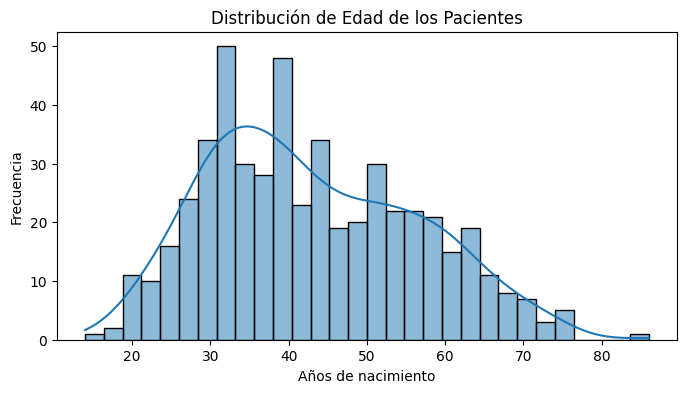

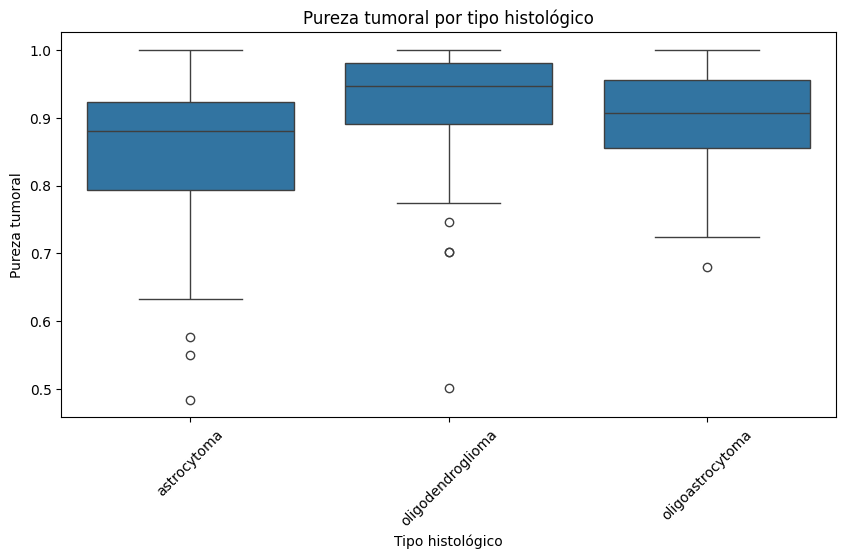

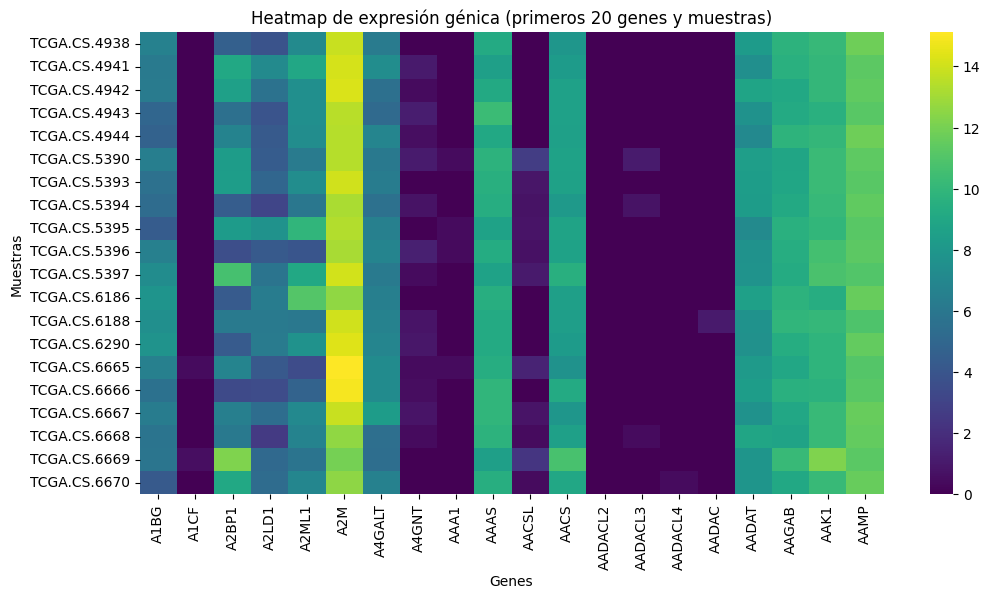

In [42]:
# Visualización de variables clínicas y expresión génica

# Histograma de edad de los pacientes
plt.figure(figsize=(8, 4))
sns.histplot(clinical_data['years_to_birth'], bins=30, kde=True)
plt.title('Distribución de Edad de los Pacientes')
plt.xlabel('Años de nacimiento')
plt.ylabel('Frecuencia')
plt.show()

# Boxplot de pureza tumoral por tipo histológico
plt.figure(figsize=(10, 5))
sns.boxplot(x='histological_type', y='Tumor_purity', data=clinical_data)
plt.title('Pureza tumoral por tipo histológico')
plt.xlabel('Tipo histológico')
plt.ylabel('Pureza tumoral')
plt.xticks(rotation=45)
plt.show()

# Heatmap de expresión génica de los primeros 20 genes
plt.figure(figsize=(12, 6))
sns.heatmap(expression_data.iloc[:20, :20], cmap='viridis')
plt.title('Heatmap de expresión génica (primeros 20 genes y muestras)')
plt.xlabel('Genes')
plt.ylabel('Muestras')
plt.show()

In [43]:
# Ingeniería de atributos sobre clinical_data

# Crear una nueva columna: edad del paciente (en años)
clinical_data['edad'] = clinical_data['years_to_birth']

# Crear una columna categórica de edad
clinical_data['grupo_edad'] = pd.cut(clinical_data['edad'], bins=[0, 30, 50, 100], labels=['<=30', '31-50', '>50'])

# Crear una columna binaria para pureza tumoral alta (>0.9)
clinical_data['pureza_alta'] = (clinical_data['Tumor_purity'] > 0.9).astype(int)

# Crear una columna binaria para supervivencia larga (>1200 días)
clinical_data['supervivencia_larga'] = (clinical_data['overall_survival'] > 1200).astype(int)

# Crear una columna para indicar si recibió radioterapia
clinical_data['radioterapia_binaria'] = (clinical_data['radiation_therapy'] == 'yes').astype(int)

# Mostrar las primeras filas con los nuevos atributos
display(clinical_data.head())

attrib_name,years_to_birth,Tumor_purity,histological_type,gender,radiation_therapy,race,ethnicity,overall_survival,status,overallsurvival,edad,grupo_edad,pureza_alta,supervivencia_larga,radioterapia_binaria
TCGA.CS.6665,51.0,0.6573,astrocytoma,female,yes,white,nothispanicorlatino,1568.0,0.0,"1568,0",51.0,>50,0,1,1
TCGA.CS.6670,43.0,0.9816,oligodendroglioma,male,NaN,white,nothispanicorlatino,1426.0,0.0,"1426,0",43.0,31-50,1,1,0
TCGA.DB.A4XC,26.0,0.8892,oligoastrocytoma,male,yes,white,nothispanicorlatino,1421.0,0.0,"1421,0",26.0,<=30,0,1,1
TCGA.DH.5141,32.0,0.9387,oligodendroglioma,male,yes,white,hispanicorlatino,968.0,0.0,"968,0",32.0,31-50,1,0,1
TCGA.DH.A66B,52.0,0.8806,astrocytoma,male,yes,white,nothispanicorlatino,1279.0,0.0,"1279,0",52.0,>50,0,1,1


In [44]:
# Selección de variables relevantes para el modelo

# Variables clínicas importantes
clin_vars = [
    'years_to_birth', 'Tumor_purity', 'histological_type', 'gender',
    'radiation_therapy', 'race', 'ethnicity', 'overall_survival', 'status'
]

# Selección de genes de interés (ejemplo: los 50 genes con mayor varianza)
gene_vars = expression_data.var().sort_values(ascending=False).head(50).index.tolist()

# Crear nuevo dataframe reducido
reduced_data = merged_data[clin_vars + gene_vars]

print("Dimensiones del dataset reducido:", reduced_data.shape)
display(reduced_data.head())

Dimensiones del dataset reducido: (514, 59)


attrib_name,years_to_birth,Tumor_purity,histological_type,gender,radiation_therapy,race,ethnicity,overall_survival,status,XIST,...,RPS28,SLC30A3,HOXA10,LHX5,KCNV1,IRX1,CRYM,CAMK1G,F5,LGR6
TCGA.CS.6665,51.0,0.6573,astrocytoma,female,yes,white,nothispanicorlatino,1568.0,0.0,12.4535,...,8.4997,2.5223,4.4379,0.7467,0.4210,5.5046,2.8952,2.5223,3.4368,2.0180
TCGA.CS.6670,43.0,0.9816,oligodendroglioma,male,NaN,white,nothispanicorlatino,1426.0,0.0,0.0000,...,9.2681,7.5955,0.0000,8.1817,4.3605,4.6683,9.0533,8.2704,12.0333,4.4624
TCGA.DB.A4XC,26.0,0.8892,oligoastrocytoma,male,yes,white,nothispanicorlatino,1421.0,0.0,0.0000,...,3.0036,7.1694,1.1867,6.0040,5.7877,7.1239,8.6953,8.2086,7.5495,2.7535
TCGA.DH.5141,32.0,0.9387,oligodendroglioma,male,yes,white,hispanicorlatino,968.0,0.0,4.0575,...,8.5746,3.0912,0.0000,2.4629,0.8092,7.4179,2.9579,4.9928,10.8323,4.0040
TCGA.DH.A66B,52.0,0.8806,astrocytoma,male,yes,white,nothispanicorlatino,1279.0,0.0,1.9715,...,9.6293,3.6170,7.6049,0.0000,2.3713,7.2568,4.4231,3.1588,1.8092,1.4166


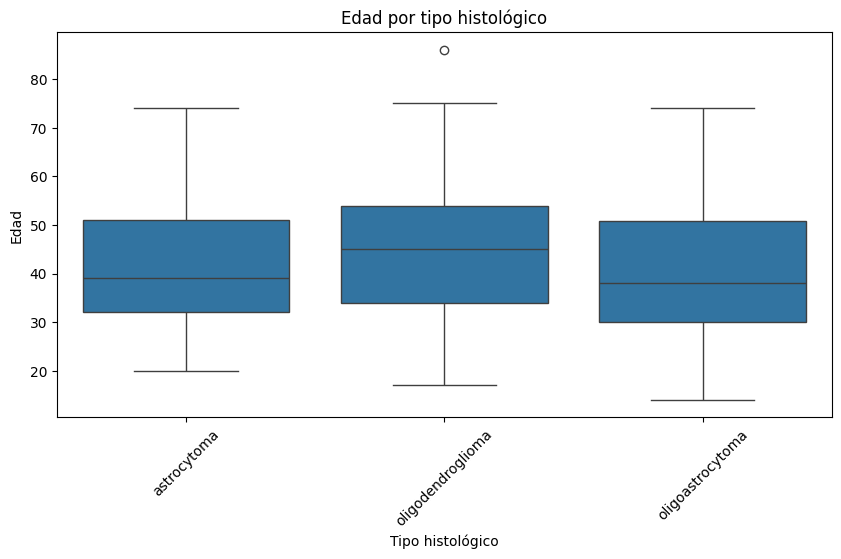

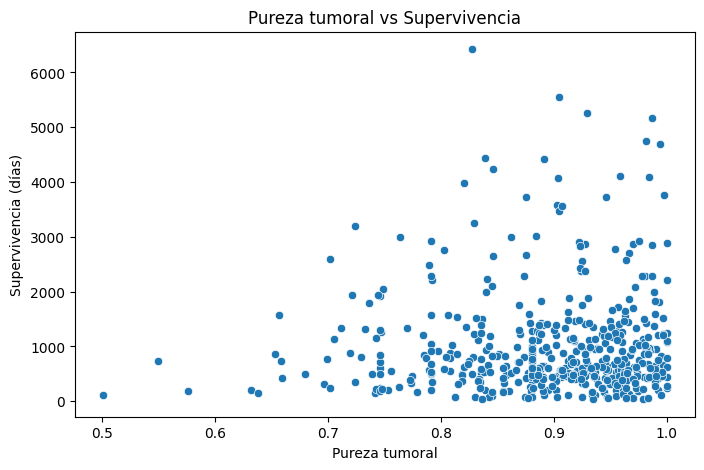

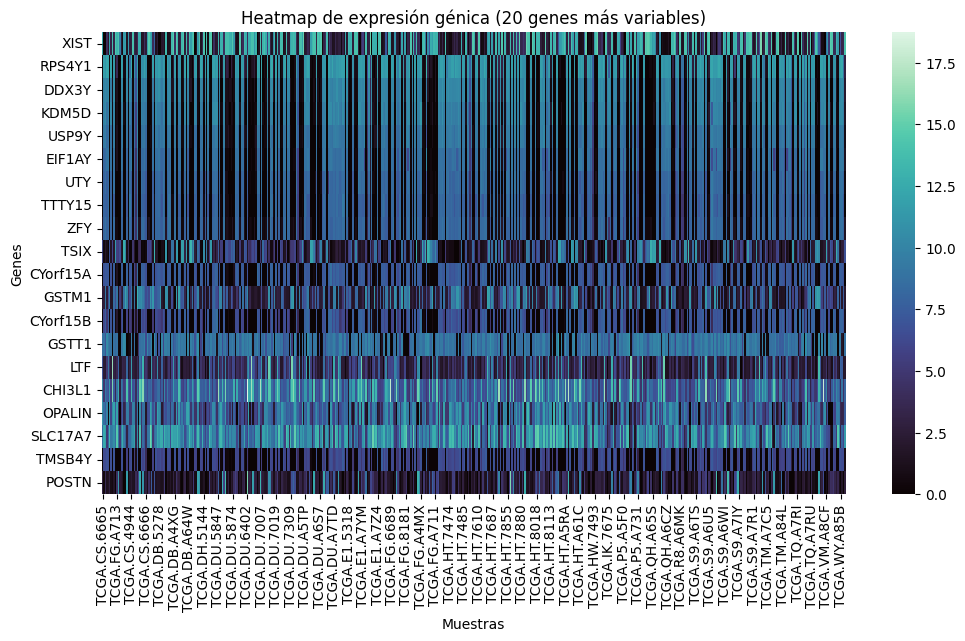

In [45]:
# Visualizaciones con el nuevo dataframe reducido

# Distribución de edad por tipo histológico
plt.figure(figsize=(10, 5))
sns.boxplot(x='histological_type', y='years_to_birth', data=reduced_data)
plt.title('Edad por tipo histológico')
plt.xlabel('Tipo histológico')
plt.ylabel('Edad')
plt.xticks(rotation=45)
plt.show()

# Correlación entre pureza tumoral y supervivencia
plt.figure(figsize=(8, 5))
sns.scatterplot(x='Tumor_purity', y='overall_survival', data=reduced_data)
plt.title('Pureza tumoral vs Supervivencia')
plt.xlabel('Pureza tumoral')
plt.ylabel('Supervivencia (días)')
plt.show()

# Heatmap de expresión génica de los 20 genes con mayor varianza
plt.figure(figsize=(12, 6))
sns.heatmap(reduced_data[gene_vars[:20]].T, cmap='mako')
plt.title('Heatmap de expresión génica (20 genes más variables)')
plt.xlabel('Muestras')
plt.ylabel('Genes')
plt.show()